# Application of Data-Science Tools for Financial Modelling. Production Sharing Agreement Cash Flow Projection.
## Abstract
Explosive growth of data science for the last few years enriched the world with ready to use tools for free (espetially, python based). Fintech, a byside, is bringing a new way a finance industry operates, as well as changing the finance itself. However, some well established spheras keep status qwo till nowdays. Thus, financial and economic modelling, particularly in oil&gas, mostly relies on commercial-off-the-shelf software and MS Excel spreadsheets, the later is the industry standart de-facto. This article is to show alternative, data-science based approach, to analyse pros and contras, and to provide python scripts for the benefit of the readers.




## Introduction
Building financial modelling is a discipline, that requires domain knowledge as far as investment and accountancy competence, contracting laws, and other finance related skills. To meet the modern trends, that requirements should supplement programming skills as well.

As of today, the complex project financial model mostly are developed by commercial out-of-the-box software, or by flexible spreadsheets of Microsoft Excel. While both ways are benefitial, they are followed by bysides. The first one is often a 'black-box' software with little chances to deep-dive into exact formulas, calculus precicion, etc. Moreover, such solutions often requires cloud-based storage of the financial modelling results, and that could be a barrier in a morden fragmenting world for a reason of data sensitivity. Another choice - MS Excel - is prone to some issues with increase of modelling complexity: too many formulas with inside- and outside-sheet's links are overwhelming to review, and such option as monte carlo simulation needs to quite complex arrangement to apply within MS Excel (not mention to sycling formula's issues, large-size files failures; in addition, manipulation with complex models lead to inconsistences and modeler's headake).

It needs to point out, that such features as transperancy, ease of to review a model (i.e. developed by contractors) and ease to test the model are, probably, even more important. In addition, ability to co-integrate new model with corporate modelling environment (i.e. to run it under changing external factors) is multipling its value.

Fast evolving field of data-science and fintech leads to development and maturing of efficient open-source modelling ecosystems. Thus, R and Python today provides great opportunity for financial modelling with stable and consise programming language, wide range of suplimentary packages, implementation tools aka 'jupyter notebook', and a lot of learning and Q&A sources easily available online for free. 

Nowdays, python is a standard modelling tool in invest banks and hedge funds, it's a [tool for ABS cash flow assessment by SEC](https://www.sec.gov/rules/proposed/2010/33-9117.pdf). There are some papers regarding [spreadsheet substitution py python](https://arxiv.org/ftp/arxiv/papers/1801/1801.09771.pdf), although there is room for improvement in the field.

To tackle the problem mentioned above, a practical approach for project financial modelling with python is presented below. A case of production shared aggrement financial modelling is discussed to fill the gap in oil&gas industry. 

The rest of the paper is organized as follows: firstly introductory description of modelling approach and tools will be discussed, secondly, the step-by-step scripting aproach to develope a model will be presented, followed by conluding remarks. Thirdly, the risk assessment approach will be under consideration. Concluding remarks provide some inferrence on this work.

## Part 1. Project Modelling
The case under consideration is from the point of view of independent oil&gas company (IOC) which is looking for a desicion of either to enter the project and sign a proper PSA with some state. This particular upstream project describes production sharing agreement (PSA) environment, presented in a book ....  [1](). All the following input data is based on the case from the book, reconsiling the results.

To come up with the answer, the following steps will be proceed:
1. Having production profile, expecting price USD20 per barrel and royalty, we will come to revenue estimation.
2. With capital expenditures (CAPEX) estimation and 5 years straght line (SL) depreciation we will get depreciation.
3. With yearly operational expenditures (OPEX) and applying cost recovery limit we will estimate cost recovery cash flow.
4. Applying profit oil split parameter we will calculate proper cash flows for IOC and State.
5. Considering bonuses, taxable income with tax loss carry forward, we will apply income tax to get net income for IOC and State.
6. Finally, we get the cash flow (CF) for both parties to calculate NPV, IRR, PI, PP and DPP.

### Scripting Specification
For the implementation of this project the following python packages were used:
- __numpy__ for vecor and matrix manipulation,
- __pandas__ for efficient dealing with time-series,
- __scipy__ for distribution sampling and optimizetion,
- __multiprocessing__ for the monte carlo simulations,
- __matplotlib__ for simple pictures,
- __holoviews__ for informative plots and dashboards.


Due to simplisity of this example, all the data inputs are inserted directly to the Jupyter Notebook and no reading of external sources is required. Although easy dealing with external data is a strong capability of python.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
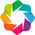

In [1]:
# import necessary python packages
import numpy as np
import pandas as pd

#import scipy as sc
from scipy.stats import truncnorm, triang
from scipy.optimize import minimize

from multiprocessing import Pool

import matplotlib.pyplot as plt
%matplotlib inline

import holoviews as hv
from holoviews.util.settings import OutputSettings
hv.extension('bokeh')

### Production Profile

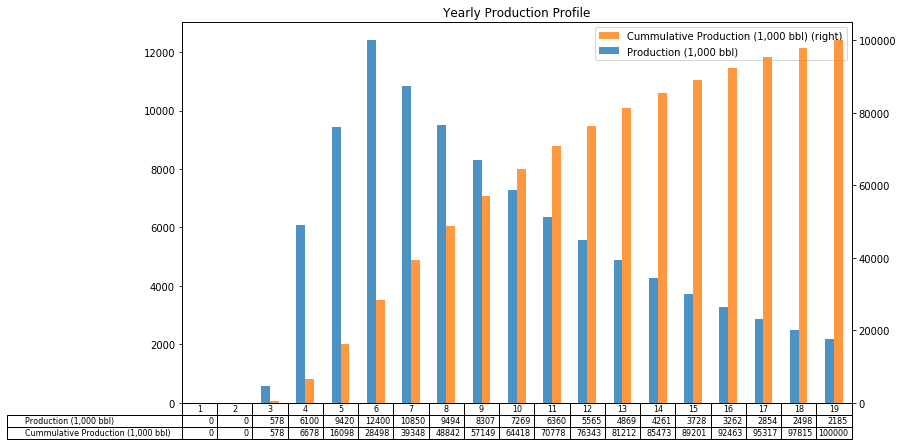

In [2]:
# Set Production Profile (values in thousands of barrels) for each year
df = pd.DataFrame([0, 0, 578, 6100, 9420, 12400, 10850, 9494, 8307,
              7269, 6360, 5565, 4869, 4261, 3728, 3262, 2854, 2498, 2185], # *1000 bbl
            index=[*range(1,20)],  # Set the years numbering from 1 to 19
            columns=['Production (1,000 bbl)'])  # Set the name of the column in the table

# Calculate cummulative production
df['Cummulative Production (1,000 bbl)'] = df['Production (1,000 bbl)'].cumsum()

# Plot production and cummulative production bar chart
ax=df.plot(kind='bar', secondary_y=['Cummulative Production (1,000 bbl)'],
           legend='reverse', figsize=(12,7), alpha=0.8,
           title='Yearly Production Profile', table=True)

# Some finer adjustment for the plot
ax.get_xaxis().set_visible(False)
tb = ax.tables[0]
tb.auto_set_font_size(False)
tb.set_fontsize(8)

# We will remove cummulative production from the dataframe
df.drop('Cummulative Production (1,000 bbl)', axis=1, inplace=True)

### Revenue

In [3]:
# Set a price USD per bbl. for each year
df['Oil Price ($/bbl)'] = 20.  # $/bbl

# Calculate Gross Revenue, in thousand USD
df['Gross Revenue ($m)'] = df[['Production (1,000 bbl)', 'Oil Price ($/bbl)']].prod(axis=1)  # $m

# Calculate Royalty and net Revenue
royalty_rate = 10/100  # 10%
df['Royalty ($m)'] = df['Gross Revenue ($m)'] * royalty_rate
df['Net Revenue ($m)'] = df['Gross Revenue ($m)'] - df['Royalty ($m)']

df.index.name = 'Year'

# Print the resulting dataframe
df.T.style.format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
"Production (1,000 bbl)",0,0,578,"6,100","9,420","12,400","10,850","9,494","8,307","7,269","6,360","5,565","4,869","4,261","3,728","3,262","2,854","2,498","2,185"
Oil Price ($/bbl),20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Gross Revenue ($m),0,0,"11,560","122,000","188,400","248,000","217,000","189,880","166,140","145,380","127,200","111,300","97,380","85,220","74,560","65,240","57,080","49,960","43,700"
Royalty ($m),0,0,"1,156","12,200","18,840","24,800","21,700","18,988","16,614","14,538","12,720","11,130","9,738","8,522","7,456","6,524","5,708","4,996","4,370"
Net Revenue ($m),0,0,"10,404","109,800","169,560","223,200","195,300","170,892","149,526","130,842","114,480","100,170","87,642","76,698","67,104","58,716","51,372","44,964","39,330"


### Capital Costs and Depreciation

In [4]:
# Capital Sosts are given in a referenced book
df['Capital Costs ($m)'] = [30000, 40000, 100000, 60000, 70000] + [0]*14

# Find first of operation year (although, it's obvious, but lets play algo)
first_year_of_operation = df.index[df['Production (1,000 bbl)']>0][0]

# 5 years straight line depreciation
years_sl = 5

# Calculate depreciation of Capex, starting not early then first year of operation
depr_schedule = pd.DataFrame(0., index=df.index,
                             columns=df.index[df['Capital Costs ($m)']>0])
# Assign yearly depreciation values
depr_schedule.loc[1:years_sl,:] = df['Capital Costs ($m)'].where(df['Capital Costs ($m)']>0) / years_sl
# Shift depreciation to proper years
depr_schedule = depr_schedule.apply(lambda x: x.shift(max(x.name, first_year_of_operation),
                                                      fill_value=0), axis=0)

# Now print depreciation schedule for the Capex from each year
depr_schedule.T

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Year,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,6000.0,6000.0,6000.0,6000.0,6000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,8000.0,8000.0,8000.0,8000.0,8000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,20000.0,20000.0,20000.0,20000.0,20000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,12000.0,12000.0,12000.0,12000.0,12000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,14000.0,14000.0,14000.0,14000.0,14000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
# Finally, sum all depreciation schedule into net Depreciation
df['Depreciation ($m)'] = depr_schedule.sum(axis=1)

# And print the resulting DataFrame
df[['Capital Costs ($m)', 'Depreciation ($m)']].T.style.format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Capital Costs ($m),"30,000","40,000","100,000","60,000","70,000",0,0,0,0,0,0,0,0,0,0,0,0,0,0
Depreciation ($m),0,0,0,"34,000","46,000","60,000","60,000","60,000","26,000","14,000",0,0,0,0,0,0,0,0,0


### Operating and Total Expenses

In [6]:
# Operating costs per bbl of production from the referenced book
df['Operating Cost ($/1000 bbl)'] = [0, 0, 5.5, 2.6, 2.4, 2.3, 2.36, 2.4, 2.46, 2.54, 
                       2.64, 2.72, 2.82, 2.94, 3.08, 3.24, 3.4, 3.6, 3.4] # $/1000 bbl

# Calculate Operating Expence 
df['Operating Expense ($m)'] = df[['Production (1,000 bbl)', 
                                   'Operating Cost ($/1000 bbl)']].prod(axis=1)
# Get Total Expences
df['Total Expenses ($m)'] = df[['Operating Expense ($m)',
                                'Depreciation ($m)']].sum(axis=1)

df[['Operating Cost ($/1000 bbl)', 'Operating Expense ($m)',
    'Total Expenses ($m)']].T.style.format("{:,.2f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Operating Cost ($/1000 bbl),0.00,0.00,5.50,2.60,2.40,2.30,2.36,2.40,2.46,2.54,2.64,2.72,2.82,2.94,3.08,3.24,3.40,3.60,3.40
Operating Expense ($m),0.00,0.00,"3,179.00","15,860.00","22,608.00","28,520.00","25,606.00","22,785.60","20,435.22","18,463.26","16,790.40","15,136.80","13,730.58","12,527.34","11,482.24","10,568.88","9,703.60","8,992.80","7,429.00"
Total Expenses ($m),0.00,0.00,"3,179.00","49,860.00","68,608.00","88,520.00","85,606.00","82,785.60","46,435.22","32,463.26","16,790.40","15,136.80","13,730.58","12,527.34","11,482.24","10,568.88","9,703.60","8,992.80","7,429.00"


### Cost Recovery

In [7]:
# Cost recovery is limited by 50% of Gross Revenue
cost_recovery_limit = 50/100 # 50%
df['Cost Recovery Limit ($m)'] = df['Gross Revenue ($m)'] * cost_recovery_limit

# Cost Recovery Carry Forward
df['C/R C/F ($m)'] = (df['Total Expenses ($m)'] - 
                      df['Cost Recovery Limit ($m)']).cumsum().clip(lower=0)

df['Cost Recovery ($m)'] = np.minimum(df['Total Expenses ($m)'] + 
                                      df['C/R C/F ($m)'].shift(1, fill_value=0),
                                      df['Cost Recovery Limit ($m)'])

df[['Cost Recovery Limit ($m)', 'C/R C/F ($m)',
    'Cost Recovery ($m)']].T.style.format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Cost Recovery Limit ($m),0,0,"5,780","61,000","94,200","124,000","108,500","94,940","83,070","72,690","63,600","55,650","48,690","42,610","37,280","32,620","28,540","24,980","21,850"
C/R C/F ($m),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Cost Recovery ($m),0,0,"3,179","49,860","68,608","88,520","85,606","82,786","46,435","32,463","16,790","15,137","13,731","12,527","11,482","10,569","9,704","8,993","7,429"


### Profit Oil Split

In [8]:
# Calculate Profit Oil
df['Total Profit Oil ($m)'] = df['Net Revenue ($m)'] - df['Cost Recovery ($m)']

# Calculate split of profit oil between IOC and State (according to refersed book)
profit_oil_split = 0.4  # 60% going to State and 40% to IOC
df['State Profit Oil Share ($m)'] = df['Total Profit Oil ($m)'] * (1 - profit_oil_split)
df['IOC Profit Oil Share ($m)'] = df['Total Profit Oil ($m)'] * profit_oil_split

### Bonuses and Taxes of IOC

In [9]:
# Signature bonus in case a PSA is signed
df['Signature Bonus ($m)'] = [1e4] + [0.]*18  # M$10

# Calculate operating income
operating_income = (df[['Cost Recovery ($m)', 'IOC Profit Oil Share ($m)']].sum(axis=1) -\
                    df[['Total Expenses ($m)', 'Signature Bonus ($m)']].sum(axis=1))

# Create function and calculate lost carry forward (no term limits in this example)
loss_carry_forward = np.frompyfunc(lambda a,b: a+b if a < 0 else b, 2, 1)
df['Taxable Income ($m)'] = loss_carry_forward.accumulate(operating_income.values, dtype=np.object)

# Calculate Income Tax of IOC
income_tax = .3 # 30%
df['Income Tax ($m)'] = df['Taxable Income ($m)'].multiply(income_tax).clip(lower=0)

df[['Signature Bonus ($m)', 'Taxable Income ($m)',
    'Income Tax ($m)']].T.style.format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Signature Bonus ($m),"10,000",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Taxable Income ($m),"-10,000","-10,000","-7,110","16,866","40,381","53,872","43,878","35,243","41,236","39,351","39,076","34,013","29,565","25,668","22,249","19,259","16,667","14,388","12,760"
Income Tax ($m),0,0,0,"5,060","12,114","16,162","13,163","10,573","12,371","11,805","11,723","10,204","8,869","7,700","6,675","5,778","5,000","4,317","3,828"


### Net Cash Flow and Discounted Cash Flow

In [10]:
df['IOC Net Cash Flow ($m)'] = (df[['Cost Recovery ($m)',
                                    'IOC Profit Oil Share ($m)']].sum(axis=1) -\
                                df[['Capital Costs ($m)', 'Operating Expense ($m)',
                                    'Signature Bonus ($m)', 'Income Tax ($m)']].sum(axis=1))

discount_rate = 12 / 100 # discount rate = 12 % (half-year)

df['IOC DCF @ 12% (half-year)'] = df['IOC Net Cash Flow ($m)'] / (1 + discount_rate)**(df.index - 0.5)


df['State Net Cash Flow ($m)'] = df[['Signature Bonus ($m)', 'Royalty ($m)',
                                     'State Profit Oil Share ($m)','Income Tax ($m)']].sum(axis=1)
df['State DCF @ 12% (half-year)'] = df['State Net Cash Flow ($m)'] / (1 + discount_rate)**(df.index - 0.5)

# Highlight of State Cash Flow Sources
df[['Signature Bonus ($m)', 'Royalty ($m)','State Profit Oil Share ($m)',
    'Income Tax ($m)','State Net Cash Flow ($m)','State DCF @ 12% (half-year)']].T.style.format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Signature Bonus ($m),"10,000",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Royalty ($m),0,0,"1,156","12,200","18,840","24,800","21,700","18,988","16,614","14,538","12,720","11,130","9,738","8,522","7,456","6,524","5,708","4,996","4,370"
State Profit Oil Share ($m),0,0,"4,335","35,964","60,571","80,808","65,816","52,864","61,854","59,027","58,614","51,020","44,347","38,502","33,373","28,888","25,001","21,583","19,141"
Income Tax ($m),0,0,0,"5,060","12,114","16,162","13,163","10,573","12,371","11,805","11,723","10,204","8,869","7,700","6,675","5,778","5,000","4,317","3,828"
State Net Cash Flow ($m),"10,000",0,"5,491","53,224","91,525","121,770","100,680","82,425","90,839","85,371","83,057","72,354","62,954","54,725","47,504","41,190","35,709","30,895","27,339"
State DCF @ 12% (half-year),"9,449",0,"4,136","35,797","54,962","65,289","48,198","35,231","34,667","29,090","25,269","19,654","15,269","11,851","9,185","7,111","5,504","4,252","3,359"


### Project CF Projection

In [11]:
df.T.style.applymap(lambda x: 'color: red' if x<0 else 'color: black').format("{:,.0f}")

Year,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
"Production (1,000 bbl)",0,0,578,"6,100","9,420","12,400","10,850","9,494","8,307","7,269","6,360","5,565","4,869","4,261","3,728","3,262","2,854","2,498","2,185"
Oil Price ($/bbl),20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Gross Revenue ($m),0,0,"11,560","122,000","188,400","248,000","217,000","189,880","166,140","145,380","127,200","111,300","97,380","85,220","74,560","65,240","57,080","49,960","43,700"
Royalty ($m),0,0,"1,156","12,200","18,840","24,800","21,700","18,988","16,614","14,538","12,720","11,130","9,738","8,522","7,456","6,524","5,708","4,996","4,370"
Net Revenue ($m),0,0,"10,404","109,800","169,560","223,200","195,300","170,892","149,526","130,842","114,480","100,170","87,642","76,698","67,104","58,716","51,372","44,964","39,330"
Capital Costs ($m),"30,000","40,000","100,000","60,000","70,000",0,0,0,0,0,0,0,0,0,0,0,0,0,0
Depreciation ($m),0,0,0,"34,000","46,000","60,000","60,000","60,000","26,000","14,000",0,0,0,0,0,0,0,0,0
Operating Cost ($/1000 bbl),0,0,6,3,2,2,2,2,2,3,3,3,3,3,3,3,3,4,3
Operating Expense ($m),0,0,"3,179","15,860","22,608","28,520","25,606","22,786","20,435","18,463","16,790","15,137","13,731","12,527","11,482","10,569","9,704","8,993","7,429"
Total Expenses ($m),0,0,"3,179","49,860","68,608","88,520","85,606","82,786","46,435","32,463","16,790","15,137","13,731","12,527","11,482","10,569","9,704","8,993","7,429"


Thus, we got the same spreadsheet as presented in the referenced book. In addtion, let's calculate NPV and IRR both  for the IOC and State. Finally, we will plot net cash flows.

### NPV, IRR

In [12]:
# NPV and IRR for IOC
npv_ioc = df['IOC DCF @ 12% (half-year)'].sum()
irr_ioc = np.irr(df['IOC Net Cash Flow ($m)'])
print('IOC NPV: \t${:,.0f} \tIRR: \t{:.1f}%'.format(npv_ioc*1e3, irr_ioc*100))

# NPV and IRR for State
npv_state = df['State DCF @ 12% (half-year)'].sum()
irr_state = np.irr(df['State Net Cash Flow ($m)'])
irr_state = irr_state if not np.isnan(irr_state) else 0

print('State NPV: \t${:,.0f} \tIRR: \t{:.1f}%'.format(npv_state*1e3, irr_state*100))

IOC NPV: 	$53,525,318 	IRR: 	18.0%
State NPV: 	$418,270,765 	IRR: 	0.0%


### Total Net Cash Flow Split

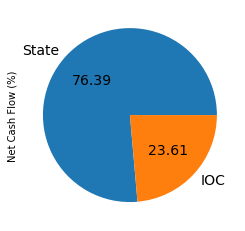

In [13]:
# Sum of net cash flows for State and IOC
series = df[['State Net Cash Flow ($m)', 'IOC Net Cash Flow ($m)']].sum()

series.index = ['State', 'IOC']
series.name = 'Net Cash Flow (%)'
series.plot.pie(autopct='%.2f', fontsize=14, figsize=(4, 4));

### Plot Net Cash Flows

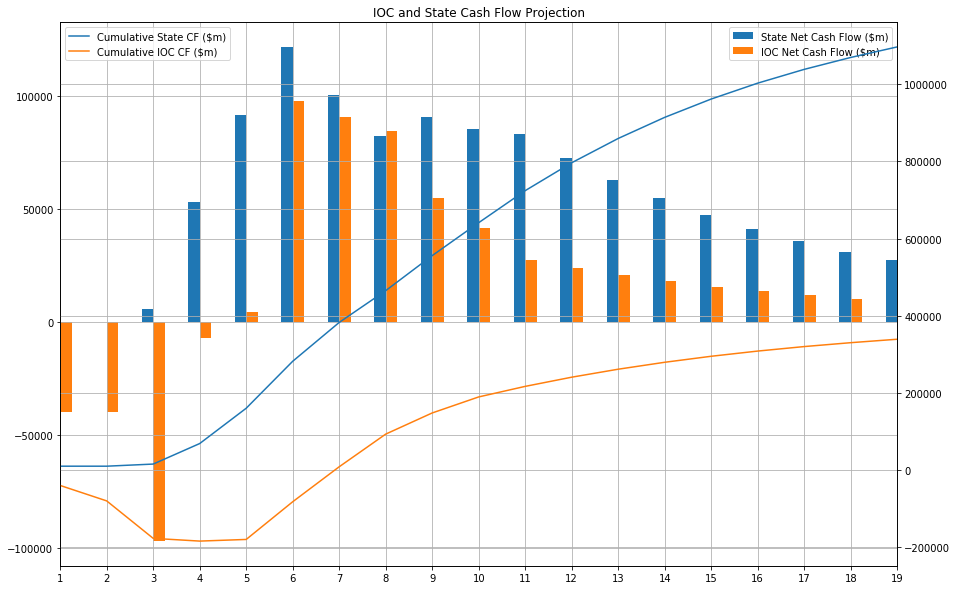

In [14]:
# Computing cummulative cash flow
cum = df[['State Net Cash Flow ($m)', 
    'IOC Net Cash Flow ($m)']].cumsum().rename(columns={'State Net Cash Flow ($m)':'Cumulative State CF ($m)',
                     'IOC Net Cash Flow ($m)':'Cumulative IOC CF ($m)'})

# Plotting the Cash Flows
ax1 = df[['State Net Cash Flow ($m)',
         'IOC Net Cash Flow ($m)']].reset_index(drop=True).plot(kind='bar', grid=True)
ax2 = ax1.twinx()
cum.reset_index(drop=True).plot(kind='line', ax=ax2, # secondary_y=True,
                                grid=True, alpha=1, legend=True, figsize=(15,10),
                                title='IOC and State Cash Flow Projection');
ax1.set_xticklabels(df.index, rotation=0);

In Part 1 we built a financial model for production sharing agreement with python sripts. The next part will show the way for estimation of risk.

## Part 2. Risk Assessment

To deal with unsertain world, the modeller should assess the influence of external and internal project factors to investment aggregates like NPV and IRR. To solve this task we will do the following:
1. Incupsulate our calculation steps from Part 1 into python class. That will allow us to manipulate with the project as with an object.
2. Performe sensitivity analysis by calculating NPV and IRR while changing some input parameters.
3. Introduce Monte Carlo simulation to get distributions for NPV and IRR
4. Build dashboard to nicely present the results of the PSA CF estimation and analysis.

Below is the python implementation and script comments.


rewrite the object to make it absolutely clearly written (easy to read)

### Model Incupsulation into Class

In [15]:
class PSAFinModel(object):
    """An object for calculating and modeling of financial data
    and cash flow of production sharing agreement
    """
    
    def __init__(self, prod_cap_op_cost, parameters_dict):
        """Input data:
        """
        self.prod_cap_op_cost = prod_cap_op_cost
        self.p = parameters_dict
    
        # cash-flow projection DataFrame
        self.df = pd.DataFrame(np.zeros((19,23)), index=[*range(1,20)])
        self.df.columns = ['Production (1,000 bbl)', 'Oil Price ($/bbl)', 'Gross Revenue ($m)',
                           'Royalty ($m)', 'Net Revenue ($m)', 'Capital Costs ($m)',
                           'Depreciation ($m)', 'Operating Cost ($/1000 bbl)',
                           'Operating Expense ($m)', 'Total Expenses ($m)',
                           'Cost Recovery Limit ($m)', 'C/R C/F ($m)', 'Cost Recovery ($m)',
                           'Total Profit Oil ($m)', 'State Profit Oil Share ($m)',
                           'IOC Profit Oil Share ($m)', 'Signature Bonus ($m)',
                           'Taxable Income ($m)', 'Income Tax ($m)', 'IOC Net Cash Flow ($m)',
                           'IOC DCF @ 12% (half-year)', 'State Net Cash Flow ($m)',
                           'State DCF @ 12% (half-year)']
        self.df.index.name = 'Year'
        
        # project kpi DataFrame
        self.kpi = pd.DataFrame(np.zeros((6,3)), columns=['IOC', 'State', 'Project'],
                                index=['CCF ($m)', 'NPV ($m)', 'IRR (%)',
                                       'PP (y)', 'DPP (y)', 'PI'])
        
        
    def get_ncf(self):
        """Step by step calculation of net cash flow of IOC and State
        """
        
        # Set input data
        self.df[['Production (1,000 bbl)', 'Capital Costs ($m)',
                 'Operating Cost ($/1000 bbl)']] = self.prod_cap_op_cost.values
        
        # Revenue
        # Set a price USD per bbl. for each year
        self.df['Oil Price ($/bbl)'] = self.p['Oil Price ($/bbl)']
        # Calculate Gross Revenue, in thousand USD
        self.df['Gross Revenue ($m)'] = self.df[['Production (1,000 bbl)',
                                                 'Oil Price ($/bbl)']].prod(axis=1) # $m
        # Calculate Royalty and net Revenue
        self.df['Royalty ($m)'] = self.df['Gross Revenue ($m)'].multiply(self.p['Royalty Rate'])
        self.df['Net Revenue ($m)'] = self.df['Gross Revenue ($m)'] - self.df['Royalty ($m)']
        
        # Capital Costs and Depreciatoin
        # Find first of operation year (although, it's obvious, but lets play algo)
        first_year_of_operation = self.df.index[self.df['Production (1,000 bbl)']>0][0]
        # Calculate depreciation of Capex, starting not early then first year of operation
        depr_schedule = pd.DataFrame(0., index=self.df.index,
                                     columns=self.df.index[self.df['Capital Costs ($m)']>0])
        # Assign yearly depreciation values
        depr_schedule.loc[1:self.p['Depreciation Term'],:] = self.df['Capital Costs ($m)'].\
                        where(self.df['Capital Costs ($m)']>0) / self.p['Depreciation Term']
        # Shift depreciation to proper years
        depr_schedule = depr_schedule.apply(lambda x: x.shift(max(x.name, first_year_of_operation),
                                                              fill_value=0), axis=0)
        # Finally, sum all depreciation schedule into net Depreciation
        self.df['Depreciation ($m)'] = depr_schedule.sum(axis=1)
 
        # Operating Costs
        # Calculate Operating Expence 
        self.df['Operating Expense ($m)'] = self.df[['Production (1,000 bbl)', 
                                                     'Operating Cost ($/1000 bbl)']].prod(axis=1)
        # Total Expense
        self.df['Total Expenses ($m)'] = self.df[['Operating Expense ($m)',
                                                  'Depreciation ($m)']].sum(axis=1)

        # Cost Revovery
        self.df['Cost Recovery Limit ($m)'] = self.df['Gross Revenue ($m)'] * self.p['Cost Recovery Limit']
        # Cost Recovery Carry Forward
        self.df['C/R C/F ($m)'] = (self.df['Total Expenses ($m)'] - 
                                   self.df['Cost Recovery Limit ($m)']).cumsum().clip(lower=0)

        self.df['Cost Recovery ($m)'] = np.minimum(self.df['Total Expenses ($m)'] + 
                                                   self.df['C/R C/F ($m)'].shift(1, fill_value=0),
                                                   self.df['Cost Recovery Limit ($m)'])  
        
        # Profit Oil
        # Calculate Profit Oil
        self.df['Total Profit Oil ($m)'] = self.df['Net Revenue ($m)'] - self.df['Cost Recovery ($m)']
        # Calculate split of profit oil between IOC and State (according to refersed book)
        self.df['State Profit Oil Share ($m)'] = self.df['Total Profit Oil ($m)'] * \
                                                (1 - self.p['IOC Profit Oil Split'])
        self.df['IOC Profit Oil Share ($m)'] = self.df['Total Profit Oil ($m)'] * \
                                                self.p['IOC Profit Oil Split']

        # Bonuses and Taxes of IOC
        # Signature bonus in case a PSA is signed
        self.df.at[1,'Signature Bonus ($m)'] = self.p['Signature Bonus']
        # Calculate operating income
        operating_income = (self.df[['Cost Recovery ($m)', 'IOC Profit Oil Share ($m)']].sum(axis=1) -\
                            self.df[['Total Expenses ($m)', 'Signature Bonus ($m)']].sum(axis=1))

        # Create function and calculate lost carry forward (no term limits in this example)
        loss_carry_forward = np.frompyfunc(lambda a,b: a+b if a < 0 else b, 2, 1)
        self.df['Taxable Income ($m)'] = loss_carry_forward.accumulate(operating_income.values, dtype=np.object)

        # Calculate Income Tax of IOC
        self.df['Income Tax ($m)'] = self.df['Taxable Income ($m)'].multiply(self.p['Income Tax']).clip(lower=0)
            
        # IOC Free Cash Flow
        self.df['IOC Net Cash Flow ($m)'] = (self.df[['Cost Recovery ($m)',
                                                      'IOC Profit Oil Share ($m)']].sum(axis=1) -\
                                             self.df[['Capital Costs ($m)', 'Operating Expense ($m)',
                                                      'Signature Bonus ($m)', 'Income Tax ($m)']].sum(axis=1))
        self.df['IOC DCF @ 12% (half-year)'] = self.df['IOC Net Cash Flow ($m)'] / \
                                           (1 + self.p['Discount Rate'])**(self.df.index - 0.5)

        # State Free Cash Flow
        self.df['State Net Cash Flow ($m)'] = self.df[['Signature Bonus ($m)', 'Royalty ($m)',
                                                       'State Profit Oil Share ($m)','Income Tax ($m)']].sum(axis=1)
        self.df['State DCF @ 12% (half-year)'] = self.df['State Net Cash Flow ($m)'] / \
                                                (1 + self.p['Discount Rate'])**(self.df.index - 0.5)
            
        return self.df[['IOC Net Cash Flow ($m)', 'IOC DCF @ 12% (half-year)',
                        'State Net Cash Flow ($m)', 'State DCF @ 12% (half-year)']]

    
    def get_kpi(self):
        """Module to calculate investment project indicators:
        Cumulative Cash Flow, Net Present Value, Internal Rate of Return,
        Payback Period, Discounted Payback Period, Profitability Index
        for investment desicion making
        """

        def payback_period(ts):
            """Function to calculate PP with for inputed time-series
            """
            if not (ts[ts.cumsum() > 0].empty | ts[ts.cumsum() < 0].empty):
                final_full_year = ts[ts.cumsum() < 0].index.values.max()
                fractional_yr = -ts.cumsum()[final_full_year]/ts[final_full_year + 1]
                pp = (final_full_year + fractional_yr)
                pp = round(pp, 1)
            elif ts[ts.cumsum() < 0].empty:
                pp = 0
            else:
                pp = np.nan
            return pp
        
        profitability_index = lambda ts:round(((ts>0)*(1-ts.cumsum()
                            / ts.cumsum().min())).max(), 1) if ts.min() < 0 else np.inf
        
        irr = lambda dcf: round(np.irr(dcf)*100, 1) if not np.isnan(np.irr(dcf)) else 0

        # a loop to get kpi values
        for i, (cf, dcf) in enumerate([(self.df['IOC Net Cash Flow ($m)'],
                                        self.df['IOC DCF @ 12% (half-year)']),
                                    (self.df['State Net Cash Flow ($m)'],
                                     self.df['State DCF @ 12% (half-year)']),
                        (self.df[['IOC Net Cash Flow ($m)',
                                  'State Net Cash Flow ($m)']].sum(axis=1),
                         self.df[['IOC DCF @ 12% (half-year)',
                                  'State DCF @ 12% (half-year)']].sum(axis=1))
                                    ]):
            self.kpi.iloc[:,i] = [round(cf.sum(), 1),
                                  round(dcf.sum(), 1),
                                  irr(cf),
                                  payback_period(cf),
                                  payback_period(dcf),
                                  profitability_index(dcf)]
        self.kpi.index.name = 'Parameter'
       
        return self.kpi
    

In [16]:
# Set input parameters
# Dictionary with major inputs
psa_parameters_dict = {
    'Oil Price ($/bbl)': 20,     # Oil proce $20/bbl for the model estimation
    'Royalty Rate': 0.1,         # Royalty rate 10%
    'Cost Recovery Limit': 0.5,  # Up to 50% of Gross Revenue
    'IOC Profit Oil Split': 0.4, # IOC 40%/ State 60%
    'Income Tax': 0.3,           # CIT 30%
    'Signature Bonus': 1e7/1e3,  # Signature Bonus $10M
    'Depreciation Method': 'SL', # Straight Line depreciation of capital assets
    'Depreciation Term': 5,      # 5 years
    'Discount Rate': .12         # 12% discounting rate
}

# DataFrame with input time-series
input_estimates = pd.DataFrame(
                  {'Production (1,000 bbl)': [0, 0, 578, 6100, 9420, 12400, 10850, 9494, 8307, 7269, 
                                              6360, 5565, 4869, 4261, 3728, 3262, 2854, 2498, 2185],
                   'Capital Costs ($m)': [30000, 40000, 100000, 60000, 70000] + [0]*14,
                   'Operating Cost ($/1000 bbl)': [0, 0, 5.5, 2.6, 2.4, 2.3, 2.36, 2.4, 2.46, 2.54, 
                                                   2.64, 2.72, 2.82, 2.94, 3.08, 3.24, 3.4, 3.6, 3.4]
                  },    
                  index=[*range(1,20)]
                              )

After the above manipulation it takes just a few strings of code to calculate prognosis cash flow.

In [17]:
# initiate object for calculations
psa = PSAFinModel(prod_cap_op_cost=input_estimates,
                  parameters_dict=psa_parameters_dict)

# calculate CF and DCF with get_ncf method
psa.get_ncf();
# calculate project kpi's
kpi = psa.get_kpi()
kpi

,IOC,State,Project
Parameter,,,
CCF ($m),339130.8,1097050.5,1436181.3
NPV ($m),53525.3,418270.8,471796.1
IRR (%),18.0,0.0,51.5
PP (y),6.9,0.0,5.1
DPP (y),8.7,0.0,5.4
PI,1.4,inf,4.6


### Sensitivity Analysis

For this part of modelling we will implement calculation of project with deviotion in production, oil price, captial costs and operational cost with range from -50% to 50%.

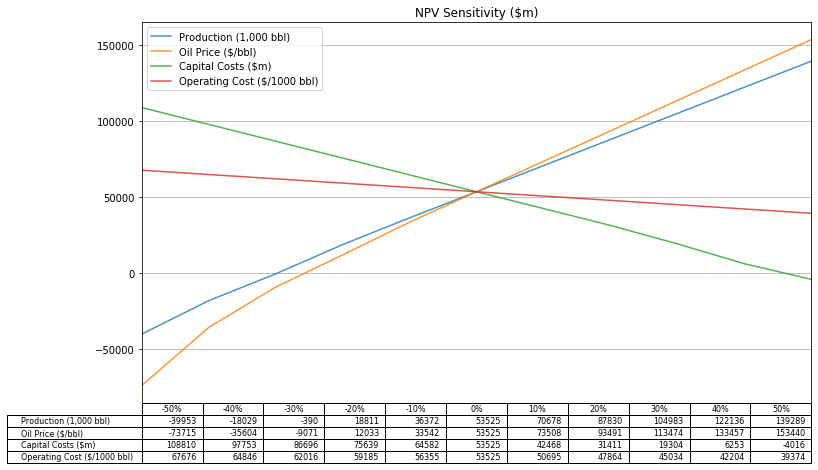

In [18]:
class PSAFinModelSens(PSAFinModel):
    """Class to deal with sensitivity
    """
    
    def get_sensitivity(self):
        """Module to calulate NPV sensitivity to deviation of price,
        production, capital and operating costs
        """
        # store 'base' input data for futher reference
        if not hasattr(self, 'base'):
            self.base = self.prod_cap_op_cost.copy(deep=True)
            self.oil_price_base = self.p['Oil Price ($/bbl)']
        
        # Create a dataframe to store the resulting data
        res = pd.DataFrame(0., columns=['Production (1,000 bbl)', 'Oil Price ($/bbl)',
                                        'Capital Costs ($m)', 'Operating Cost ($/1000 bbl)'],
                          index=[*range(-50,51,10)])
        res.index.name = '%'
        
        # Calculate the NPV for each deviation from the base value
        for i in res.index:
            k = i * 0.01 + 1 
            for c in res.columns:
                if c == 'Oil Price ($/bbl)':
                    self.prod_cap_op_cost = self.base.copy()
                    self.p['Oil Price ($/bbl)'] = self.oil_price_base * k
                else:
                    self.prod_cap_op_cost = self.base.copy()
                    self.p['Oil Price ($/bbl)'] = self.oil_price_base
                    self.prod_cap_op_cost[c] = self.prod_cap_op_cost[c].values * k
                
                self.get_ncf()
                res.at[i, c] = self.df['IOC DCF @ 12% (half-year)'].sum()
                
        return res
                    

# Creating an instance of the object
psa_sens = PSAFinModelSens(prod_cap_op_cost=input_estimates,
                           parameters_dict=psa_parameters_dict)

# Get the dataframe with sensitivity analysis results
sens = psa_sens.get_sensitivity()

# Plot the results of Sensitivity analysis
sens.index = sens.index.astype(str) + '%'

ax3 = sens.astype(int).plot(figsize=(12,7), alpha=0.8, grid=True,
          title='NPV Sensitivity ($m)', table=True)
# Some finer adjustment for the plot
ax3.get_xaxis().set_visible(False)
tb = ax3.tables[0]
tb.auto_set_font_size(False)
tb.set_fontsize(8)

### Breakeven Oil Price
This approach on figure above shows us a way to estimate breakeven price, in the point where orange line cross zero. So far, we will show the function for this calculation.

In [19]:
# Create a copy of reference dictionary with input data
psa_parameters_dict_be = psa_parameters_dict.copy()

def get_breakeven(x):
    """Function with price input to return NPV squared,
    which allows to find breakeven price minimizing NPV to zero
    """
    global input_estimates, psa_parameters_dict_be    
    psa_parameters_dict_be['Oil Price ($/bbl)'] = x[0]
    psa = PSAFinModel(prod_cap_op_cost=input_estimates,
                      parameters_dict=psa_parameters_dict_be)
    psa.get_ncf()
    return (psa.df['IOC DCF @ 12% (half-year)'].sum())**2



# getting breakeven price
min_res = minimize(get_breakeven, 20, tol=1e-2)
breakeven_price = min_res.x[0]

print('Breakeven oil price: \t${:,.3f} $/bbl'.format(breakeven_price))

Breakeven oil price: 	$14.747 $/bbl


### Monte Carlo Simulation
For now we consider Monte Carlo approach, when we repeat calculation many for the input data sampled from the distribution. Let us chose truncated standard normal distribution (BetaPERT distribution, or any other, can be implemented similar way). For simplicity, we will regard the data that we used for sensitivity analysis, and we ... with mean 1 and standard deviation 0.3 with M million sample paths.

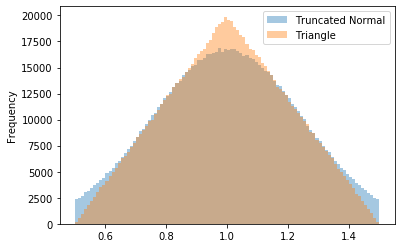

In [20]:
N = 1000000  # amount of samples from the distributions

# genereating truncated normal distribution samples and scaling them
mc_truncnorm = truncnorm.rvs(-2., 2., size=N) * 0.25 + 1
# generating triangle distribution samples and scaling them
mc_triang = triang.rvs(.5, size=N) + 0.5

# creating DataFrame with samples and plotting it
df_mc = pd.DataFrame({'Truncated Normal': mc_truncnorm, 'Triangle': mc_triang})
df_mc.plot(kind='hist', bins=100, alpha=0.4);

We can see both distributions not far from each other, for more balanced result the truncated normal will be selected. To proceed with quite a lot paths we will need to implement multiprocessing culculations for speading up. Let's see where it goes.

In [21]:
%%time

N = 100000
# creating N Monte Carlo paths (deviations of initial input data)
mc = truncnorm.rvs(-2., 2., size=(N, 19, 3)) * 0.25 + 1

def get_npv_irr(mc):
    """Fuction to get NPV and IRR for the each Monte Carlo path
    """
    # getting the previosly set input parameters
    global input_estimates, psa_parameters_dict
    # make a copy for further adjustment
    psa_parameters_dict_mc = psa_parameters_dict.copy()
    input_estimates_mc = input_estimates.copy()
    
    # set the MC path values according to inputed 2D array
    psa_parameters_dict_mc['Oil Price ($/bbl)'] *= mc[0, 0]
    input_estimates_mc *= mc[:, :3]
    
    psa = PSAFinModel(prod_cap_op_cost=input_estimates_mc,
                      parameters_dict=psa_parameters_dict_mc)
    psa.get_ncf()
    return [psa.df['IOC DCF @ 12% (half-year)'].sum(), np.irr(psa.df['IOC Net Cash Flow ($m)'])]

# implementing multiprocessing to spead up calculations
if __name__ == '__main__':
    with Pool() as p:
        res = p.map(get_npv_irr, mc)

CPU times: user 36.4 s, sys: 452 ms, total: 36.8 s
Wall time: 7min 51s


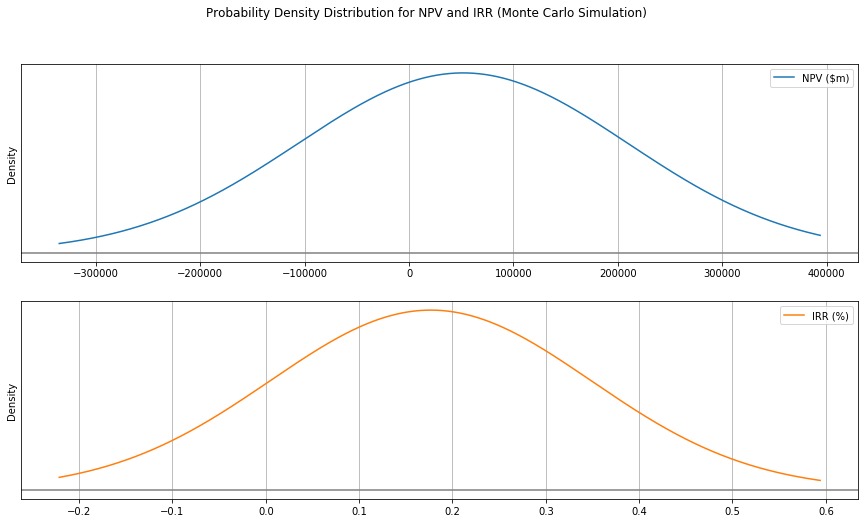

In [22]:
# storing the resulting NPV and IRR values into DataFrame for plotting
mc_res_ = pd.DataFrame(res, columns=['NPV ($m)', 'IRR (%)'])

ax = mc_res_.plot.density(subplots=True, sharex=False, sharey=False,
                         figsize=(15,8), grid=True, bw_method=3, yticks=[],
                         title='Probability Density Distribution for NPV and IRR (Monte Carlo Simulation)');
ax[0].axhline(0, c='grey')
ax[1].axhline(0, c='grey')
plt.show()

### Interactive Dashboard for Scanario Analysis
Lastly, we will present interactive dashboard HoloMap for presentation purposes. Current implementation will show preliminary calculated results, whereas DynamicMap could recalculate on the go thus presenting even more powerfull options. We will create meny to manually change project parameters that we previously modelled as well as some others. We will also add 

In [23]:
def dashboard(rr, crl, split, cit, price, prod, capex):
    """A fuction to create visuals for plotting in the dashboard
    """
    # inputs that we use before
    global input_estimates, psa_parameters_dict
    
    # making a copy not to change the base values
    params = psa_parameters_dict.copy()
    estimates = input_estimates.copy()
    
    # adjusting inputs according to the value of a parameter in dashboard
    params['Royalty Rate'] = rr / 100
    params['Cost Recovery Limit'] = crl / 100
    params['IOC Profit Oil Split'] = split / 100
    params['Income Tax'] = cit / 100
    params['Oil Price ($/bbl)'] = price
    
    estimates['Production (1,000 bbl)'] *= (prod / 100)
    estimates['Capital Costs ($m)'] *= (capex / 100)
    
    # initiate object for calculations
    psa = PSAFinModel(prod_cap_op_cost=estimates,
                      parameters_dict=params)

    # calculate CF and DCF with get_ncf method
    psa.get_ncf()
    # calculate project kpi's
    kpi = psa.get_kpi()
    
    # create a holoviews table for the dashboard
    table = hv.Table(kpi.reset_index()).options(width=700, title='Project Performance')
    
    # prepare data and create holoviews bar chart for the dashboard
    df_fcf = psa.df[['IOC Net Cash Flow ($m)',
                  'State Net Cash Flow ($m)']].\
         rename(columns={"IOC Net Cash Flow ($m)": "IOC Net Cash Flow",
                         "State Net Cash Flow ($m)": "State Net Cash Flow"}).\
         div(1e3).reset_index().melt(id_vars=['Year'], var_name='Entity',
                                     value_name='Value')

    bars = hv.Bars(df_fcf, ['Year', 'Entity'], hv.Dimension('Value', unit='$M', range=(-120,300) ))\
       .options(color=hv.Cycle('Category20'), show_legend=True, stacked=True, tools=['hover'],
                height=400, width=700, legend_position='top_right', title_format='Project Cash Flow')
    
    return (table + bars).cols(1)


In [24]:
# Creating a dictionary to contain visuals
dashboard_dict = {(rr, crl, split, cit, price, prod, capex):
                  dashboard(rr, crl, split, cit, price, prod, capex)
                      for rr in [5, 8, 10]
                          for crl in [50, 60]
                              for split in [40, 50, 60]
                                  for cit in [15, 20, 30]
                                      for price in [15, 20, 25]
                                          for prod in [90, 100, 110]
                                              for capex in [90, 100, 110]
                 }

In [26]:
# Drawing a Dashboard with scenarios
OutputSettings.options['max_frames'] = 2000
kdims=['Royalty Rate (%)', 'Cost Recovery Limit (%)', 'IOC/State Profit Oil Split (%)',
       'Income Tax (%)', 'Oil Price ($/bbl)', 'Production (%)', 'Capital Cost (%)']
hv.HoloMap(dashboard_dict, kdims=kdims, sort=True).collate().opts(title='')

:Layout
   .Table.I :HoloMap   [Royalty Rate (%),Cost Recovery Limit (%),IOC/State Profit Oil Split (%),Income Tax (%),Oil Price ($/bbl),Production (%),Capital Cost (%)]
      :Table   [Parameter,IOC,State,Project]
   .Bars.I  :HoloMap   [Royalty Rate (%),Cost Recovery Limit (%),IOC/State Profit Oil Split (%),Income Tax (%),Oil Price ($/bbl),Production (%),Capital Cost (%)]
      :Bars   [Year,Entity]   (Value)

## Concluding Remarks

Upper 4 parameters describes a zero sum game of the PSA and they characterize the terms of the contract between the IOC and the state. Below three parameters are mostly external, although production and capital cost are more or less manageble by the IOC operator.


Some parts of this model looks like overcomplicated comparing to excel. It's probably the metter of dealing with new technology, which is just different from the software that you already know.

Let us summarize macro level benefits of building financial models with python:

- python has developed ecosystem of the data-science and financial engineering easy-to-use tools (for free)
- python allows to build simple-to-comlex models and integrate them within corporate information infractructure
- open source nature of python allows to control all the computational and modelling aspects, in addition to secure storing sensitive modelling data within corporate environment.

However, evident disadvantage of this approach is the lack of python skills amoung financial industry professionals.

For the conveniounce of the reader this paper is also available as a Jupyter notebook version, and as Google colaboratory version.

Please, feel free to comment or/and provide your feadback to the auther.

### Bibliography
[1] A. Lipken and M.H. Moffett, The Global Oil&Gas Industry Management, Strategy & Finance. 2012

[2] Hilpshic. Python for Finance

CFA Program Curriculum
